<a href="https://www.kaggle.com/code/hritikshukla007/coca-cola-stocks?scriptVersionId=253358546" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/coke-data/Coca-Cola_stock_info.csv
/kaggle/input/coke-data/Coca-Cola_stock_history.csv


## Importing Necessary Libraries

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

import plotly.graph_objects as go

# For reading stock data from yahoo
from pandas_datareader.data import DataReader

# For time stamps
from datetime import datetime
from math import sqrt

from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler

#ignore the warnings
import warnings
warnings.filterwarnings('ignore')

### Load Dataset

In [3]:
KO_Data = pd.read_csv('/kaggle/input/coke-data/Coca-Cola_stock_history.csv')

### Basic EDA

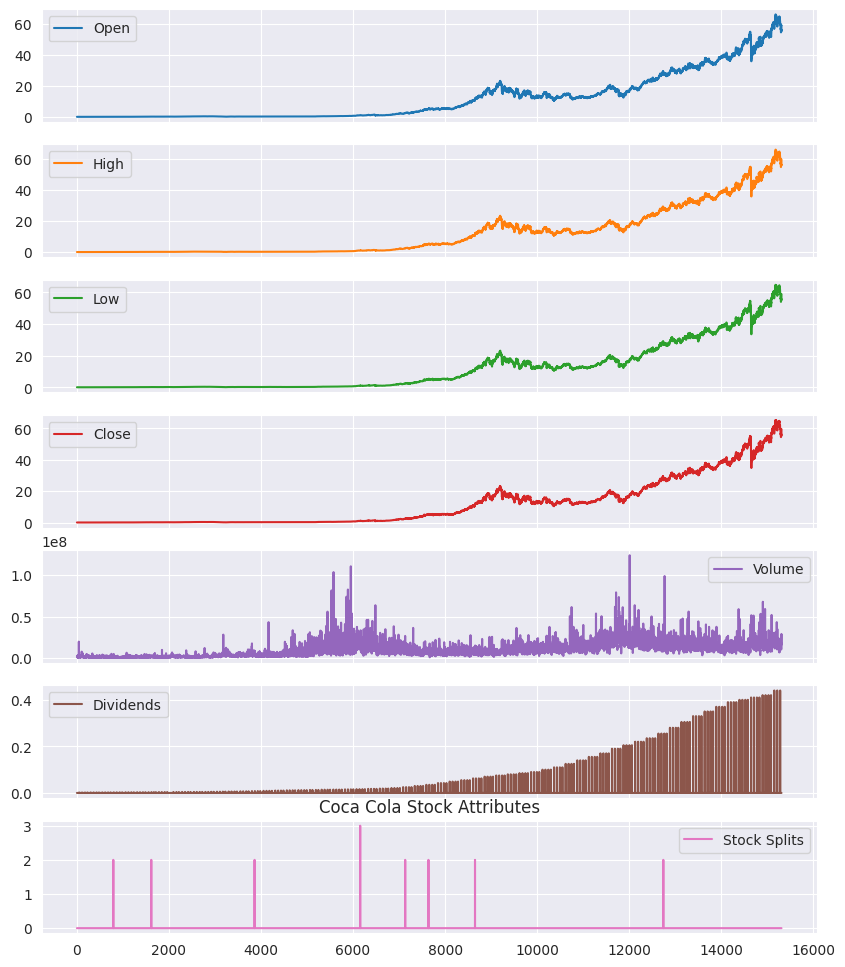

In [4]:
KO_Data.plot(subplots = True, figsize = (10,12))
plt.title('Coca Cola Stock Attributes')
plt.show()

In [5]:
def plot_close_val(data_frame, column, stock):
    plt.figure(figsize=(16,6))
    plt.title(column + ' Price History for ' + stock )
    plt.plot(data_frame[column])
    plt.xlabel('Date', fontsize=18)
    plt.ylabel(column + ' Price USD ($) for ' + stock, fontsize=18)
    plt.show()

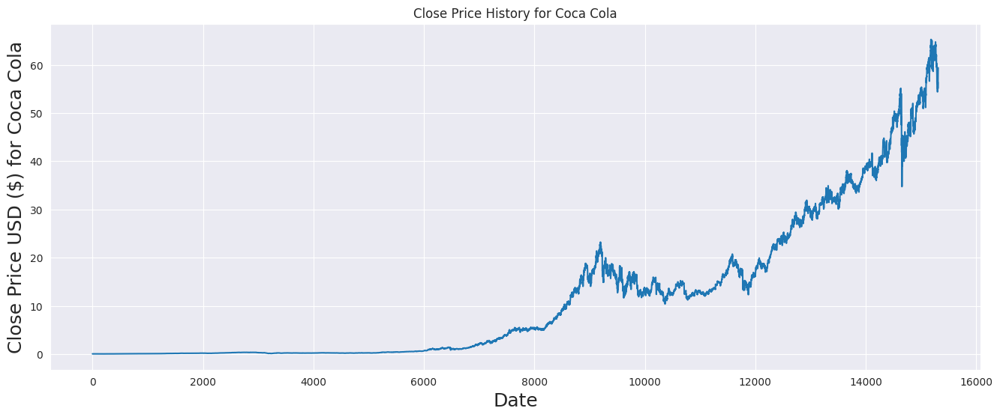

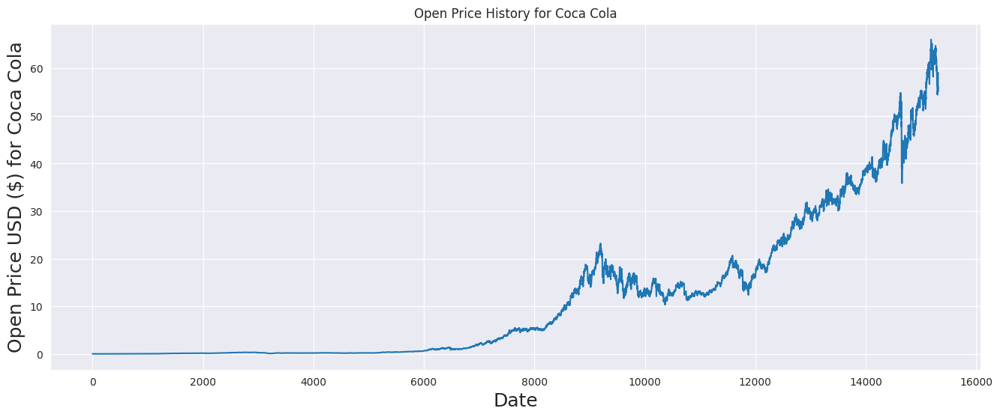

In [6]:
#Test the function
plot_close_val(KO_Data, 'Close', 'Coca Cola')
plot_close_val(KO_Data, 'Open', 'Coca Cola')

<Axes: >

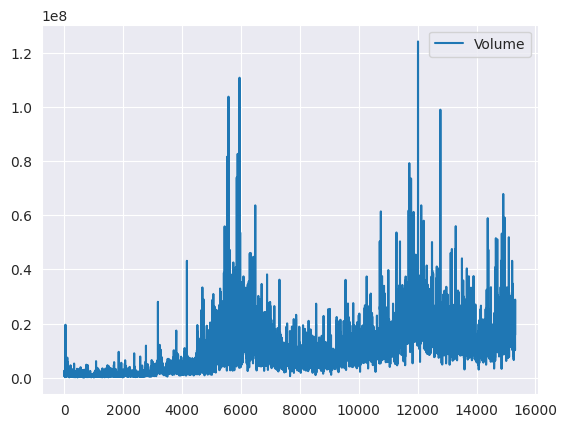

In [7]:
KO_Data[["Volume"]].plot()

In [8]:
ko_info = pd.read_csv('/kaggle/input/coke-data/Coca-Cola_stock_info.csv',
                      header=None,
                      names=(['Description','Information']))

ko_info.dropna()
ko_info.drop(ko_info.loc[ko_info['Information']=='nan'].index, inplace=True)
ko = ko_info.sort_values('Information').style

ko

,Description,Information
49,gmtOffSetMilliseconds,-18000000
145,bid,0
138,ask,0
77,heldPercentInsiders,0.00636
68,sharesPercentSharesOut,0.0074
100,shortPercentOfFloat,0.0074
108,trailingAnnualDividendYield,0.027917083
147,dividendYield,0.028099999
29,returnOnAssets,0.07831
75,SandP52WeekChange,0.15025425


In [9]:
# Isolate the adjusted closing prices

adj_close_px = KO_Data['Close']

# Calculate the moving average
moving_avg = adj_close_px.rolling(window=40).mean()

# Inspect the result
moving_avg[-10:]

15301    59.573229
15302    59.329031
15303    59.103823
15304    58.921440
15305    58.725320
15306    58.504966
15307    58.298918
15308    58.171838
15309    58.088689
15310    58.030935
Name: Close, dtype: float64

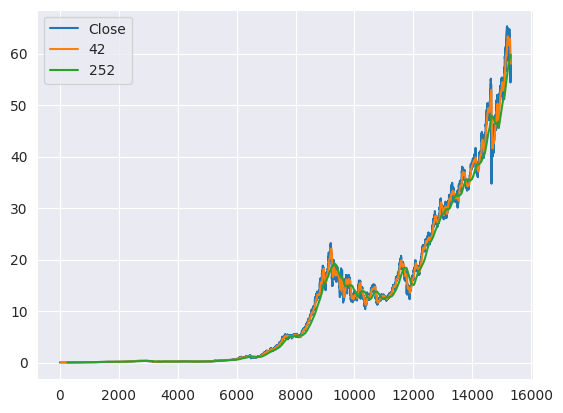

In [10]:
# Short moving window rolling mean
KO_Data['42'] = adj_close_px.rolling(window=40).mean()

# Long moving window rolling mean
KO_Data['252'] = adj_close_px.rolling(window=252).mean()

# Plot the adjusted closing price, the short and long windows of rolling means
KO_Data[['Close', '42', '252']].plot()

plt.show()

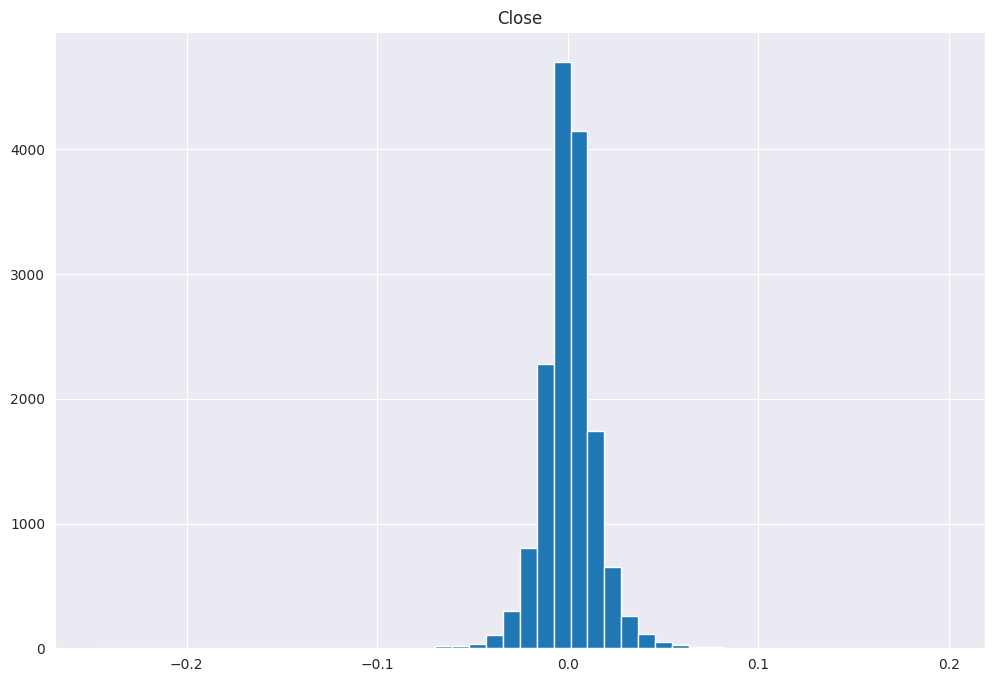

In [11]:
daily_close_px = KO_Data[['Close']]
# Calculate the daily percentage change for `daily_close_px`
daily_pct_change = daily_close_px.pct_change()

# Plot the distributions
daily_pct_change.hist(bins=50, sharex=True, figsize=(12,8))

# Show the resulting plot
plt.show()

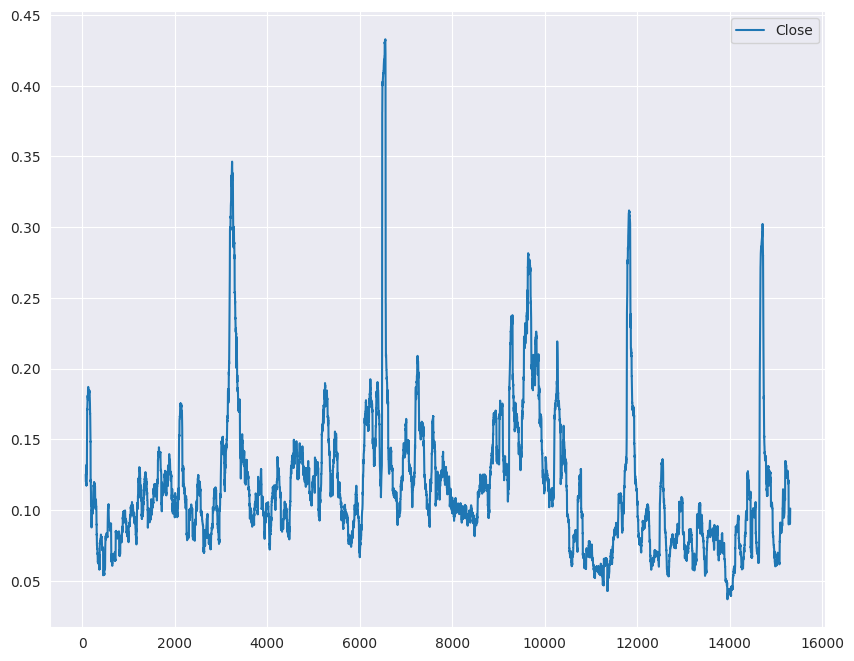

In [12]:
# Define the minumum of periods to consider
min_periods = 75

# Calculate the volatility
vol = daily_pct_change.rolling(min_periods).std() * np.sqrt(min_periods)

# Plot the volatility
vol.plot(figsize=(10, 8))

# Show the plot
plt.show()

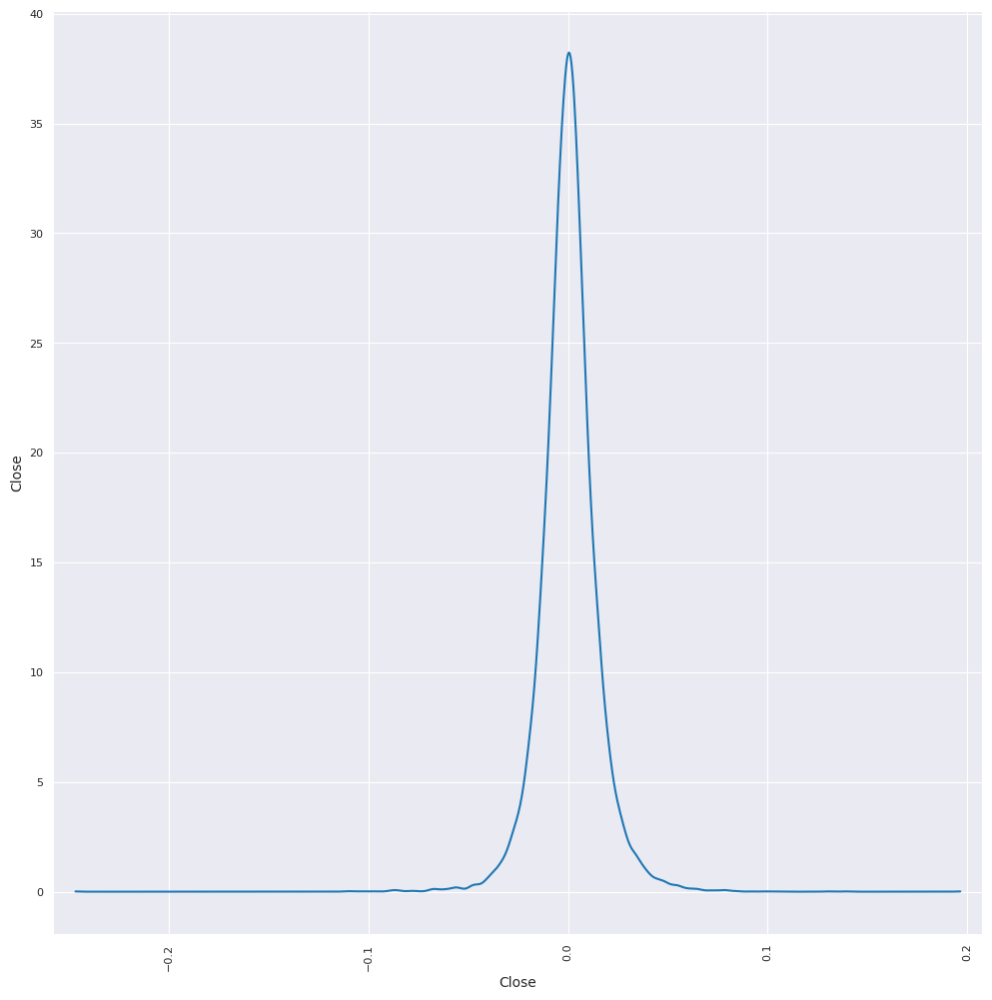

In [13]:
# Plot a scatter matrix with the `daily_pct_change` data
pd.plotting.scatter_matrix(daily_pct_change, diagonal='kde',
alpha=0.1,figsize=(12,12))

# Show the plot
plt.show()

In [14]:
# Ensure 'Date' is in datetime format and sorted
KO_Data['Date'] = pd.to_datetime(KO_Data['Date'], errors='coerce', utc=True).dt.tz_localize(None)

KO_Data = KO_Data.sort_values('Date')
KO_Data = KO_Data.reset_index(drop=True)

# Create OHLC plot
fig = go.Figure(data=go.Ohlc(x=KO_Data['Date'],
                             open=KO_Data['Open'],
                             high=KO_Data['High'],
                             low=KO_Data['Low'],
                             close=KO_Data['Close'])
               )

# Optional layout styling
fig.update_layout(title='KO Stock Price - OHLC Chart',
                  xaxis_title='Date',
                  yaxis_title='Price',
                  xaxis_rangeslider_visible=False,  # Hide bottom range slider
                  template='plotly_dark')  # You can try 'plotly_white' too

fig.show()


In [15]:
#KO_Data=KO_Data.reset_index()

KO_Data['SMA5'] = KO_Data.Close.rolling(5).mean()
KO_Data['SMA20'] = KO_Data.Close.rolling(20).mean()
KO_Data['SMA50'] = KO_Data.Close.rolling(50).mean()
KO_Data['SMA200'] = KO_Data.Close.rolling(200).mean()
KO_Data['SMA500'] = KO_Data.Close.rolling(500).mean()

fig = go.Figure(data=[go.Ohlc(x=KO_Data['Date'],open=KO_Data['Open'],
                              high=KO_Data['High'],
                              low=KO_Data['Low'],
                              close=KO_Data['Close'],
                              name = "OHLC"),

                      go.Scatter(x=KO_Data.Date,
                                 y=KO_Data.SMA5,
                                 line=dict(color='orange', width=1),
                                 name="SMA5"),

                      go.Scatter(x=KO_Data.Date,
                                 y=KO_Data.SMA20,
                                 line=dict(color='green', width=1),
                                 name="SMA20"),

                      go.Scatter(x=KO_Data.Date,
                                 y=KO_Data.SMA50,
                                 line=dict(color='blue', width=1),
                                 name="SMA50"),

                      go.Scatter(x=KO_Data.Date,
                                 y=KO_Data.SMA200,
                                 line=dict(color='violet', width=1),
                                 name="SMA200"),

                      go.Scatter(x=KO_Data.Date,
                                 y=KO_Data.SMA500,
                                 line=dict(color='purple', width=1),
                                 name="SMA500")]
               )
fig.show()

In [16]:
KO_Data['EMA5'] = KO_Data.Close.ewm(span=5,
                                    adjust=False).mean()

KO_Data['EMA20'] = KO_Data.Close.ewm(span=20,
                                     adjust=False).mean()

KO_Data['EMA50'] = KO_Data.Close.ewm(span=50,
                                     adjust=False).mean()

KO_Data['EMA200'] = KO_Data.Close.ewm(span=200,
                                      adjust=False).mean()

KO_Data['EMA500'] = KO_Data.Close.ewm(span=500,
                                      adjust=False).mean()

fig = go.Figure(data=[go.Ohlc(x=KO_Data['Date'],
                              open=KO_Data['Open'],
                              high=KO_Data['High'],
                              low=KO_Data['Low'],
                              close=KO_Data['Close'],
                              name = "OHLC"),

                      go.Scatter(x=KO_Data.Date,
                                 y=KO_Data.SMA5,
                                 line=dict(color='orange', width=1),
                                 name="EMA5"),

                      go.Scatter(x=KO_Data.Date,
                                 y=KO_Data.SMA20,
                                 line=dict(color='green', width=1),
                                 name="EMA20"),

                      go.Scatter(x=KO_Data.Date,
                                 y=KO_Data.SMA50,
                                 line=dict(color='blue', width=1),
                                 name="EMA50"),

                      go.Scatter(x=KO_Data.Date,
                                 y=KO_Data.SMA200,
                                 line=dict(color='violet', width=1),
                                 name="EMA200"),

                      go.Scatter(x=KO_Data.Date,
                                 y=KO_Data.SMA500,
                                 line=dict(color='purple', width=1),
                                 name="EMA500")]
               )
fig.show()

In [17]:
KO_Data.head()
#KO_Data.fillna(0)
#KO_Data.set_index('Date')

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,42,252,SMA5,SMA20,SMA50,SMA200,SMA500,EMA5,EMA20,EMA50,EMA200,EMA500
0,1962-01-02,0.050016,0.051378,0.050016,0.050016,806400,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.050016,0.050016,0.050016,0.050016,0.050016
1,1962-01-03,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.049644,0.049910,0.049972,0.050005,0.050011
2,1962-01-04,0.049026,0.049645,0.049026,0.049273,844800,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.049521,0.049849,0.049945,0.049998,0.050009
3,1962-01-05,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.049067,0.049688,0.049875,0.049979,0.050001
4,1962-01-08,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0,NaN,NaN,0.048803,NaN,NaN,NaN,NaN,0.048599,0.049495,0.049788,0.049956,0.049992


In [18]:
try:
    from finta import TA
    from backtesting import Backtest, Strategy
    from backtesting.lib import crossover
except:
    !pip install finta backtesting --q
    from finta import TA
    from backtesting import Backtest, Strategy
    from backtesting.lib import crossover

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.1/192.1 kB 6.6 MB/s eta 0:00:00


Loading BokehJS ...

In [19]:
fin_ma = pd.read_csv('/kaggle/input/coke-data/Coca-Cola_stock_history.csv',
            parse_dates=True)
print(fin_ma.head())
ohlc=fin_ma
print(TA.SMA(ohlc, 42))

         Date      Open      High       Low     Close   Volume  Dividends  \
0  1962-01-02  0.050016  0.051378  0.050016  0.050016   806400        0.0   
1  1962-01-03  0.049273  0.049273  0.048159  0.048902  1574400        0.0   
2  1962-01-04  0.049026  0.049645  0.049026  0.049273   844800        0.0   
3  1962-01-05  0.049273  0.049892  0.048035  0.048159  1420800        0.0   
4  1962-01-08  0.047787  0.047787  0.046735  0.047664  2035200        0.0   

   Stock Splits  
0             0  
1             0  
2             0  
3             0  
4             0  
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
15306    58.759467
15307    58.572686
15308    58.422110
15309    58.297065
15310    58.219369
Name: 42 period SMA, Length: 15311, dtype: float64


## DEMA Cross Stragey

In [20]:
"""
TECHNICAL ANALYSIS LIBRARY ALTERNATIVES TO FINTA
=================================================

Here are the best alternatives to finta, ranked by popularity and reliability:
"""

# 1. TA-LIB (Most Popular and Comprehensive)
# Installation: pip install TA-Lib
# Note: May require additional setup on some systems

def example_talib():
    """
    TA-Lib - The gold standard for technical analysis
    Most comprehensive library with 150+ indicators
    """
    import talib
    import pandas as pd
    import matplotlib.pyplot as plt

    # Example usage (uncomment when you have data)
    """
    # Your OHLC data
    # ohlc = pd.read_csv('your_data.csv')

    # Simple Moving Average
    sma = talib.SMA(ohlc['close'].values, timeperiod=20)

    # Exponential Moving Average
    ema = talib.EMA(ohlc['close'].values, timeperiod=20)

    # RSI
    rsi = talib.RSI(ohlc['close'].values, timeperiod=14)

    # MACD
    macd, macd_signal, macd_hist = talib.MACD(ohlc['close'].values)

    # Bollinger Bands
    bb_upper, bb_middle, bb_lower = talib.BBANDS(ohlc['close'].values)

    # Plot examples
    plt.figure(figsize=(12, 8))

    plt.subplot(3, 1, 1)
    plt.plot(ohlc.index, ohlc['close'], label='Close')
    plt.plot(ohlc.index, sma, label='SMA(20)')
    plt.plot(ohlc.index, ema, label='EMA(20)')
    plt.legend()
    plt.title('Price and Moving Averages')

    plt.subplot(3, 1, 2)
    plt.plot(ohlc.index, rsi, label='RSI')
    plt.axhline(y=70, color='r', linestyle='--', alpha=0.5)
    plt.axhline(y=30, color='g', linestyle='--', alpha=0.5)
    plt.legend()
    plt.title('RSI')

    plt.subplot(3, 1, 3)
    plt.plot(ohlc.index, macd, label='MACD')
    plt.plot(ohlc.index, macd_signal, label='Signal')
    plt.bar(ohlc.index, macd_hist, label='Histogram', alpha=0.3)
    plt.legend()
    plt.title('MACD')

    plt.tight_layout()
    plt.show()
    """

    # List of popular TA-Lib functions
    talib_functions = {
        # Moving Averages
        'SMA': 'Simple Moving Average',
        'EMA': 'Exponential Moving Average',
        'WMA': 'Weighted Moving Average',
        'DEMA': 'Double Exponential Moving Average',
        'TEMA': 'Triple Exponential Moving Average',
        'TRIMA': 'Triangular Moving Average',
        'KAMA': 'Kaufman Adaptive Moving Average',
        'MAMA': 'MESA Adaptive Moving Average',
        'T3': 'Triple Exponential Moving Average',

        # Oscillators
        'RSI': 'Relative Strength Index',
        'STOCH': 'Stochastic',
        'STOCHF': 'Stochastic Fast',
        'STOCHRSI': 'Stochastic RSI',
        'MACD': 'Moving Average Convergence/Divergence',
        'PPO': 'Percentage Price Oscillator',
        'ROC': 'Rate of Change',
        'MOM': 'Momentum',
        'CCI': 'Commodity Channel Index',
        'CMO': 'Chande Momentum Oscillator',
        'WILLR': 'Williams %R',
        'ULTOSC': 'Ultimate Oscillator',

        # Volatility
        'ATR': 'Average True Range',
        'NATR': 'Normalized ATR',
        'TRANGE': 'True Range',
        'BBANDS': 'Bollinger Bands',

        # Volume
        'AD': 'Chaikin A/D Line',
        'ADOSC': 'Chaikin A/D Oscillator',
        'OBV': 'On Balance Volume',

        # Price Transform
        'AVGPRICE': 'Average Price',
        'MEDPRICE': 'Median Price',
        'TYPPRICE': 'Typical Price',
        'WCLPRICE': 'Weighted Close Price',

        # Volatility
        'BBANDS': 'Bollinger Bands',
        'NATR': 'Normalized Average True Range',
        'TRANGE': 'True Range',

        # Cycle Indicators
        'HT_DCPERIOD': 'Hilbert Transform - Dominant Cycle Period',
        'HT_DCPHASE': 'Hilbert Transform - Dominant Cycle Phase',
        'HT_PHASOR': 'Hilbert Transform - Phasor Components',
        'HT_SINE': 'Hilbert Transform - SineWave',
        'HT_TRENDMODE': 'Hilbert Transform - Trend vs Cycle Mode'
    }

    print("TA-LIB Installation:")
    print("pip install TA-Lib")
    print("\nNote: On some systems you may need:")
    print("- Windows: Download wheel from https://www.lfd.uci.edu/~gohlke/pythonlibs/#ta-lib")
    print("- Mac: brew install ta-lib")
    print("- Linux: sudo apt-get install libta-lib-dev")

    return talib_functions

# 2. PANDAS-TA (Most User-Friendly)
# Installation: pip install pandas-ta

def example_pandas_ta():
    """
    Pandas-TA - Most intuitive and pandas-integrated
    Easy to use, great documentation
    """
    import pandas_ta as ta
    import pandas as pd
    import matplotlib.pyplot as plt

    # Example usage (uncomment when you have data)
    """
    # Your OHLC data
    # ohlc = pd.read_csv('your_data.csv')

    # Add all indicators at once
    ohlc.ta.strategy()  # Adds 130+ indicators!

    # Or add specific indicators
    ohlv['SMA_20'] = ta.sma(ohlc['close'], length=20)
    ohlv['EMA_20'] = ta.ema(ohlc['close'], length=20)
    ohlv['RSI_14'] = ta.rsi(ohlc['close'], length=14)
    ohlv['MACD'] = ta.macd(ohlc['close'])['MACD_12_26_9']

    # Bollinger Bands returns a DataFrame
    bb = ta.bbands(ohlc['close'], length=20, std=2)
    ohlv = pd.concat([ohlv, bb], axis=1)

    # Plot
    fig, axes = plt.subplots(3, 1, figsize=(12, 10))

    # Price and Moving Averages
    axes[0].plot(ohlc.index, ohlc['close'], label='Close')
    axes[0].plot(ohlc.index, ohlc['SMA_20'], label='SMA(20)')
    axes[0].plot(ohlc.index, ohlc['EMA_20'], label='EMA(20)')
    axes[0].fill_between(ohlc.index, bb['BBL_20_2.0'], bb['BBU_20_2.0'], alpha=0.1)
    axes[0].legend()
    axes[0].set_title('Price and Indicators')

    # RSI
    axes[1].plot(ohlc.index, ohlc['RSI_14'])
    axes[1].axhline(y=70, color='r', linestyle='--', alpha=0.5)
    axes[1].axhline(y=30, color='g', linestyle='--', alpha=0.5)
    axes[1].set_title('RSI')

    # MACD
    macd_df = ta.macd(ohlc['close'])
    axes[2].plot(ohlc.index, macd_df['MACD_12_26_9'], label='MACD')
    axes[2].plot(ohlc.index, macd_df['MACDs_12_26_9'], label='Signal')
    axes[2].bar(ohlc.index, macd_df['MACDh_12_26_9'], label='Histogram', alpha=0.3)
    axes[2].legend()
    axes[2].set_title('MACD')

    plt.tight_layout()
    plt.show()
    """

    pandas_ta_indicators = {
        'sma': 'Simple Moving Average',
        'ema': 'Exponential Moving Average',
        'wma': 'Weighted Moving Average',
        'hma': 'Hull Moving Average',
        'rma': 'Wilders Moving Average',
        'zlma': 'Zero Lag Moving Average',
        'rsi': 'Relative Strength Index',
        'stoch': 'Stochastic Oscillator',
        'macd': 'MACD',
        'bbands': 'Bollinger Bands',
        'atr': 'Average True Range',
        'obv': 'On Balance Volume',
        'adx': 'Average Directional Index',
        'cci': 'Commodity Channel Index',
        'willr': 'Williams %R',
        'cmf': 'Chaikin Money Flow',
        'mfi': 'Money Flow Index',
        'roc': 'Rate of Change',
        'tsi': 'True Strength Index',
        'uo': 'Ultimate Oscillator',
        'vwap': 'Volume Weighted Average Price',
        'vwma': 'Volume Weighted Moving Average',
        'donchian': 'Donchian Channels',
        'kc': 'Keltner Channels',
        'psar': 'Parabolic SAR',
        'supertrend': 'SuperTrend',
        'ichimoku': 'Ichimoku Cloud',
        'fibr': 'Fibonacci Retracements',
        'pivots': 'Pivot Points'
    }

    print("PANDAS-TA Installation:")
    print("pip install pandas-ta")
    print("\nUsage is very intuitive:")
    print("df.ta.sma(length=20)  # Simple moving average")
    print("df.ta.strategy()      # Add ALL indicators")

    return pandas_ta_indicators

# 3. MANUAL IMPLEMENTATION (Most Reliable)
def manual_indicators_comprehensive():
    """
    Manual implementations - always work, no dependencies
    """
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt

    class TechnicalIndicators:
        @staticmethod
        def sma(data, window):
            """Simple Moving Average"""
            return data.rolling(window=window).mean()

        @staticmethod
        def ema(data, window):
            """Exponential Moving Average"""
            return data.ewm(span=window).mean()

        @staticmethod
        def rsi(data, window=14):
            """Relative Strength Index"""
            delta = data.diff()
            gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
            loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
            rs = gain / loss
            return 100 - (100 / (1 + rs))

        @staticmethod
        def macd(data, fast=12, slow=26, signal=9):
            """MACD"""
            ema_fast = data.ewm(span=fast).mean()
            ema_slow = data.ewm(span=slow).mean()
            macd = ema_fast - ema_slow
            macd_signal = macd.ewm(span=signal).mean()
            macd_histogram = macd - macd_signal
            return macd, macd_signal, macd_histogram

        @staticmethod
        def bollinger_bands(data, window=20, std_dev=2):
            """Bollinger Bands"""
            sma = data.rolling(window=window).mean()
            std = data.rolling(window=window).std()
            upper = sma + (std * std_dev)
            lower = sma - (std * std_dev)
            return upper, sma, lower

        @staticmethod
        def atr(high, low, close, window=14):
            """Average True Range"""
            high_low = high - low
            high_close = np.abs(high - close.shift())
            low_close = np.abs(low - close.shift())
            tr = pd.concat([high_low, high_close, low_close], axis=1).max(axis=1)
            return tr.rolling(window=window).mean()

        @staticmethod
        def stochastic(high, low, close, k_window=14, d_window=3):
            """Stochastic Oscillator"""
            lowest_low = low.rolling(window=k_window).min()
            highest_high = high.rolling(window=k_window).max()
            k_percent = 100 * ((close - lowest_low) / (highest_high - lowest_low))
            d_percent = k_percent.rolling(window=d_window).mean()
            return k_percent, d_percent

        @staticmethod
        def williams_r(high, low, close, window=14):
            """Williams %R"""
            highest_high = high.rolling(window=window).max()
            lowest_low = low.rolling(window=window).min()
            wr = -100 * ((highest_high - close) / (highest_high - lowest_low))
            return wr

        @staticmethod
        def cci(high, low, close, window=20):
            """Commodity Channel Index"""
            tp = (high + low + close) / 3
            sma_tp = tp.rolling(window=window).mean()
            mad = tp.rolling(window=window).apply(lambda x: np.abs(x - x.mean()).mean())
            cci = (tp - sma_tp) / (0.015 * mad)
            return cci

        @staticmethod
        def obv(close, volume):
            """On Balance Volume"""
            obv = (np.sign(close.diff()) * volume).fillna(0).cumsum()
            return obv

    return TechnicalIndicators

# 4. COMPLETE PLOTTING FUNCTION FOR ANY LIBRARY
def plot_technical_indicators(ohlc_data, library='pandas_ta'):
    """
    Universal plotting function that works with multiple libraries
    """
    import matplotlib.pyplot as plt
    import pandas as pd

    if library == 'talib':
        try:
            import talib

            # Calculate indicators
            sma = talib.SMA(ohlc_data['close'].values, timeperiod=20)
            ema = talib.EMA(ohlc_data['close'].values, timeperiod=20)
            rsi = talib.RSI(ohlc_data['close'].values, timeperiod=14)
            macd, macd_signal, macd_hist = talib.MACD(ohlc_data['close'].values)
            bb_upper, bb_middle, bb_lower = talib.BBANDS(ohlc_data['close'].values)

            # Plot
            fig, axes = plt.subplots(3, 1, figsize=(15, 12))

            # Price and Moving Averages
            axes[0].plot(ohlc_data.index, ohlc_data['close'], label='Close', linewidth=1)
            axes[0].plot(ohlc_data.index, sma, label='SMA(20)', alpha=0.7)
            axes[0].plot(ohlc_data.index, ema, label='EMA(20)', alpha=0.7)
            axes[0].fill_between(ohlc_data.index, bb_lower, bb_upper, alpha=0.1, label='Bollinger Bands')
            axes[0].legend()
            axes[0].set_title('Price and Moving Averages (TA-Lib)')
            axes[0].grid(True, alpha=0.3)

            # RSI
            axes[1].plot(ohlc_data.index, rsi, label='RSI', color='purple')
            axes[1].axhline(y=70, color='r', linestyle='--', alpha=0.5, label='Overbought')
            axes[1].axhline(y=30, color='g', linestyle='--', alpha=0.5, label='Oversold')
            axes[1].set_ylim(0, 100)
            axes[1].legend()
            axes[1].set_title('RSI')
            axes[1].grid(True, alpha=0.3)

            # MACD
            axes[2].plot(ohlc_data.index, macd, label='MACD', color='blue')
            axes[2].plot(ohlc_data.index, macd_signal, label='Signal', color='red')
            axes[2].bar(ohlc_data.index, macd_hist, label='Histogram', alpha=0.3, color='gray')
            axes[2].legend()
            axes[2].set_title('MACD')
            axes[2].grid(True, alpha=0.3)

            plt.tight_layout()
            plt.show()

        except ImportError:
            print("TA-Lib not installed. Install with: pip install TA-Lib")

    elif library == 'pandas_ta':
        try:
            import pandas_ta as ta

            # Calculate indicators
            ohlc_copy = ohlc_data.copy()
            ohlc_copy['SMA_20'] = ta.sma(ohlc_data['close'], length=20)
            ohlc_copy['EMA_20'] = ta.ema(ohlc_data['close'], length=20)
            ohlc_copy['RSI_14'] = ta.rsi(ohlc_data['close'], length=14)

            macd_df = ta.macd(ohlc_data['close'])
            bb_df = ta.bbands(ohlc_data['close'], length=20, std=2)

            # Plot
            fig, axes = plt.subplots(3, 1, figsize=(15, 12))

            # Price and Moving Averages
            axes[0].plot(ohlc_data.index, ohlc_data['close'], label='Close', linewidth=1)
            axes[0].plot(ohlc_data.index, ohlc_copy['SMA_20'], label='SMA(20)', alpha=0.7)
            axes[0].plot(ohlc_data.index, ohlc_copy['EMA_20'], label='EMA(20)', alpha=0.7)
            if bb_df is not None:
                axes[0].fill_between(ohlc_data.index, bb_df.iloc[:, 0], bb_df.iloc[:, 2], alpha=0.1, label='Bollinger Bands')
            axes[0].legend()
            axes[0].set_title('Price and Moving Averages (Pandas-TA)')
            axes[0].grid(True, alpha=0.3)

            # RSI
            axes[1].plot(ohlc_data.index, ohlc_copy['RSI_14'], label='RSI', color='purple')
            axes[1].axhline(y=70, color='r', linestyle='--', alpha=0.5, label='Overbought')
            axes[1].axhline(y=30, color='g', linestyle='--', alpha=0.5, label='Oversold')
            axes[1].set_ylim(0, 100)
            axes[1].legend()
            axes[1].set_title('RSI')
            axes[1].grid(True, alpha=0.3)

            # MACD
            if macd_df is not None:
                axes[2].plot(ohlc_data.index, macd_df.iloc[:, 0], label='MACD', color='blue')
                axes[2].plot(ohlc_data.index, macd_df.iloc[:, 1], label='Signal', color='red')
                axes[2].bar(ohlc_data.index, macd_df.iloc[:, 2], label='Histogram', alpha=0.3, color='gray')
            axes[2].legend()
            axes[2].set_title('MACD')
            axes[2].grid(True, alpha=0.3)

            plt.tight_layout()
            plt.show()

        except ImportError:
            print("Pandas-TA not installed. Install with: pip install pandas-ta")

    elif library == 'manual':
        # Use manual implementations
        TI = manual_indicators_comprehensive()

        # Calculate indicators
        sma = TI.sma(ohlc_data['close'], 20)
        ema = TI.ema(ohlc_data['close'], 20)
        rsi = TI.rsi(ohlc_data['close'], 14)
        macd, macd_signal, macd_hist = TI.macd(ohlc_data['close'])
        bb_upper, bb_middle, bb_lower = TI.bollinger_bands(ohlc_data['close'])

        # Plot
        fig, axes = plt.subplots(3, 1, figsize=(15, 12))

        # Price and Moving Averages
        axes[0].plot(ohlc_data.index, ohlc_data['close'], label='Close', linewidth=1)
        axes[0].plot(ohlc_data.index, sma, label='SMA(20)', alpha=0.7)
        axes[0].plot(ohlc_data.index, ema, label='EMA(20)', alpha=0.7)
        axes[0].fill_between(ohlc_data.index, bb_lower, bb_upper, alpha=0.1, label='Bollinger Bands')
        axes[0].legend()
        axes[0].set_title('Price and Moving Averages (Manual Implementation)')
        axes[0].grid(True, alpha=0.3)

        # RSI
        axes[1].plot(ohlc_data.index, rsi, label='RSI', color='purple')
        axes[1].axhline(y=70, color='r', linestyle='--', alpha=0.5, label='Overbought')
        axes[1].axhline(y=30, color='g', linestyle='--', alpha=0.5, label='Oversold')
        axes[1].set_ylim(0, 100)
        axes[1].legend()
        axes[1].set_title('RSI')
        axes[1].grid(True, alpha=0.3)

        # MACD
        axes[2].plot(ohlc_data.index, macd, label='MACD', color='blue')
        axes[2].plot(ohlc_data.index, macd_signal, label='Signal', color='red')
        axes[2].bar(ohlc_data.index, macd_hist, label='Histogram', alpha=0.3, color='gray')
        axes[2].legend()
        axes[2].set_title('MACD')
        axes[2].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

# SUMMARY AND RECOMMENDATIONS
def print_recommendations():
    """
    Print recommendations for choosing a TA library
    """
    print("=== TECHNICAL ANALYSIS LIBRARY RECOMMENDATIONS ===")
    print()
    print("🥇 BEST OVERALL: TA-Lib")
    print("   • Most comprehensive (150+ indicators)")
    print("   • Industry standard, very fast")
    print("   • Used by professional trading platforms")
    print("   • Installation: pip install TA-Lib")
    print("   • May need system dependencies")
    print()
    print("🥈 BEST FOR BEGINNERS: pandas-ta")
    print("   • Very intuitive syntax")
    print("   • Great documentation")
    print("   • Easy installation: pip install pandas-ta")
    print("   • Integrates perfectly with pandas")
    print()
    print("🥉 MOST RELIABLE: Manual Implementation")
    print("   • Always works, no dependencies")
    print("   • Full control over calculations")
    print("   • Educational value")
    print("   • Easy to customize")
    print()
    print("OTHER OPTIONS:")
    print("   • yfinance: pip install yfinance (includes some TA)")
    print("   • stockstats: pip install stockstats")
    print("   • ta: pip install ta (technical-analysis)")
    print("   • btalib: pip install btalib")
    print()
    print("USAGE EXAMPLE:")
    print("# For any library, use:")
    print("plot_technical_indicators(ohlc_data, library='talib')     # or 'pandas_ta' or 'manual'")

if __name__ == "__main__":
    print_recommendations()

=== TECHNICAL ANALYSIS LIBRARY RECOMMENDATIONS ===

🥇 BEST OVERALL: TA-Lib
   • Most comprehensive (150+ indicators)
   • Industry standard, very fast
   • Used by professional trading platforms
   • Installation: pip install TA-Lib
   • May need system dependencies

🥈 BEST FOR BEGINNERS: pandas-ta
   • Very intuitive syntax
   • Great documentation
   • Easy installation: pip install pandas-ta
   • Integrates perfectly with pandas

🥉 MOST RELIABLE: Manual Implementation
   • Always works, no dependencies
   • Full control over calculations
   • Educational value
   • Easy to customize

OTHER OPTIONS:
   • yfinance: pip install yfinance (includes some TA)
   • stockstats: pip install stockstats
   • ta: pip install ta (technical-analysis)
   • btalib: pip install btalib

USAGE EXAMPLE:
# For any library, use:
plot_technical_indicators(ohlc_data, library='talib')     # or 'pandas_ta' or 'manual'


In [21]:
!pip install -q pandas_ta

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.1/115.1 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [22]:
ohlc.columns = ['date',	'open',	'high',	'low', 'close',	'volume', 'dividends', 'stock splits']

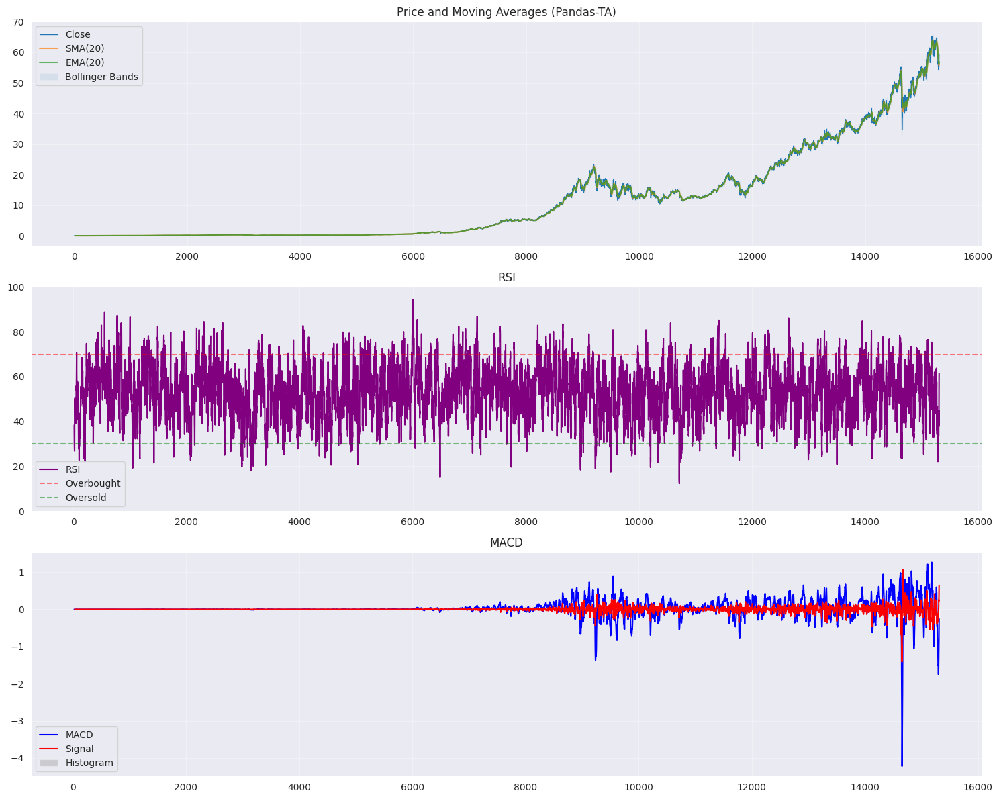

In [23]:
plot_technical_indicators(ohlc, library='pandas_ta')

In [24]:
# Defining DEMA cross strategy
class DemaCross(Strategy):

    def init(self):
        self.ma1 = self.I(TA.DEMA, ohlc, 10)
        self.ma2 = self.I(TA.DEMA, ohlc, 20)

    def next(self):
        if crossover(self.ma1, self.ma2):

            self.buy()
        elif crossover(self.ma2, self.ma1):
            self.sell()

In [25]:
ohlc.columns = ['Date',	'Open',	'High',	'Low', 'Close',	'Volume', 'Dividends', 'Stock Splits']

bt = Backtest(ohlc,
              DemaCross,
              cash=100000,
              commission=0.015,
              exclusive_orders=True)

bt.run()
bt.plot()

Backtest.run:   0%|          | 0/15310 [00:00<?, ?bar/s]

GridPlot(id='p1325', ...)

## Backtesting

In [26]:
from backtesting import Strategy
from backtesting.lib import crossover
from backtesting.test import SMA


In [27]:
data =ohlc

def BBANDS(data, n_lookback, n_std):
    """Bollinger bands indicator"""
    hlc3 = (data.High + data.Low + data.Close) / 3
    mean, std = hlc3.rolling(n_lookback).mean(), hlc3.rolling(n_lookback).std()
    upper = mean + n_std*std
    lower = mean - n_std*std
    return upper, lower

close = data.Close.values
sma10 = SMA(data.Close, 10)
sma20 = SMA(data.Close, 20)
sma50 = SMA(data.Close, 50)
sma100 = SMA(data.Close, 100)
upper, lower = BBANDS(data, 20, 2)

# Design matrix / independent features:

# Price-derived features
data['X_SMA10'] = (close - sma10) / close
data['X_SMA20'] = (close - sma20) / close
data['X_SMA50'] = (close - sma50) / close
data['X_SMA100'] = (close - sma100) / close

data['X_DELTA_SMA10'] = (sma10 - sma20) / close
data['X_DELTA_SMA20'] = (sma20 - sma50) / close
data['X_DELTA_SMA50'] = (sma50 - sma100) / close

# Indicator features
data['X_MOM'] = data.Close.pct_change(periods=2)
data['X_BB_upper'] = (upper - close) / close
data['X_BB_lower'] = (lower - close) / close
data['X_BB_width'] = (upper - lower) / close
#data['X_Sentiment'] = ~data.index.to_series().between('2017-09-27', '2017-12-14')

# Some datetime features for good measure
#data['X_day'] = data.index.dayofweek
#data['X_hour'] = data.index.hour

#data = data.apply(pd.to_numeric)
#data = data.dropna().astype(np.float64)
#data.fillna(method="ffill")
#data =data[~data.isin([np.nan, np.inf, -np.inf]).any(1)]

#data.replace([np.inf, -np.inf], 0.0, inplace=True)
#data = data.fillna(data.mean(), inplace=True)
#data = data.dropna().astype(np.float64)

In [28]:
from backtesting import Backtest, Strategy
from backtesting.lib import crossover
from backtesting.test import SMA
import pandas as pd
import numpy as np

class Sma4Cross(Strategy):
    n1 = 25
    n2 = 50
    n_enter = 12
    n_exit = 8

    def init(self):
        self.sma1 = self.I(SMA, self.data.Close, self.n1, overlay=True)
        self.sma2 = self.I(SMA, self.data.Close, self.n2, overlay=True)
        self.sma_enter = self.I(SMA, self.data.Close, self.n_enter, overlay=True)
        self.sma_exit = self.I(SMA, self.data.Close, self.n_exit, overlay=True)

        # Add a counter to prevent over-trading
        self.last_trade_bar = 0

    def next(self):
        try:
            # Check if indicators are ready
            if (np.isnan(self.sma1[-1]) or np.isnan(self.sma2[-1]) or
                np.isnan(self.sma_enter[-1]) or np.isnan(self.sma_exit[-1])):
                return

            if len(self.data) < max(self.n1, self.n2) + 5:
                return

        except (IndexError, ValueError):
            return

        # Prevent trading too frequently - minimum 5 bars between trades
        if len(self.data) - self.last_trade_bar < 5:
            return

        # Strong trend filter - require significant separation
        trend_strength = abs(self.sma1[-1] - self.sma2[-1]) / self.sma2[-1]
        if trend_strength < 0.03:  # Increased to 3%
            return

        # Additional volatility filter - avoid trading in choppy markets
        recent_high = max(self.data.High[-10:])
        recent_low = min(self.data.Low[-10:])
        volatility = (recent_high - recent_low) / recent_low
        if volatility > 0.1:  # Skip if too volatile (>10%)
            return

        if not self.position:
            # More restrictive entry conditions
            if self.sma1[-1] > self.sma2[-1]:  # Bullish trend
                # Require price to be above both trend SMAs AND crossing above entry SMA
                if (self.data.Close[-1] > self.sma1[-1] and
                    self.data.Close[-1] > self.sma2[-1] and
                    self.data.Close[-2] <= self.sma_enter[-2] and
                    self.data.Close[-1] > self.sma_enter[-1]):
                    self.buy()
                    self.last_trade_bar = len(self.data)

            elif self.sma1[-1] < self.sma2[-1]:  # Bearish trend
                # Require price to be below both trend SMAs AND crossing below entry SMA
                if (self.data.Close[-1] < self.sma1[-1] and
                    self.data.Close[-1] < self.sma2[-1] and
                    self.data.Close[-2] >= self.sma_enter[-2] and
                    self.data.Close[-1] < self.sma_enter[-1]):
                    self.sell()
                    self.last_trade_bar = len(self.data)
        else:
            # Exit conditions
            if self.position.is_long:
                if (self.data.Close[-2] >= self.sma_exit[-2] and
                    self.data.Close[-1] < self.sma_exit[-1]) or self.sma1[-1] < self.sma2[-1]:
                    self.position.close()
                    self.last_trade_bar = len(self.data)

            elif self.position.is_short:
                if (self.data.Close[-2] <= self.sma_exit[-2] and
                    self.data.Close[-1] > self.sma_exit[-1]) or self.sma1[-1] > self.sma2[-1]:
                    self.position.close()
                    self.last_trade_bar = len(self.data)


In [29]:
# Test with a simple run first
# Assuming your data is loaded in a variable called 'data'
# Make sure your data has OHLC columns: Open, High, Low, Close
# and a datetime index

def run_backtest(data):
    """Helper function to run backtest with error handling"""
    try:
        # Create backtest instance
        bt = Backtest(data, Sma4Cross, commission=0.002, exclusive_orders=True)

        # Run with default parameters first
        print("Running backtest with default parameters...")
        stats = bt.run()
        print("Backtest completed successfully!")
        print(f"Final equity: ${stats['Equity Final [$]']:,.2f}")
        print(f"Return: {stats['Return [%]']:.2f}%")
        print(f"Number of trades: {stats['# Trades']}")
        print(f"Win rate: {stats['Win Rate [%]']:.1f}%")
        print(f"Max drawdown: {stats['Max. Drawdown [%]']:.2f}%")

        # Check if strategy is performing poorly
        if stats['Return [%]'] < -50:
            print("\n⚠️  WARNING: Strategy showing large losses!")
            print("This might indicate:")
            print("- Issues with entry/exit logic")
            print("- Too frequent trading")
            print("- Data quality problems")
            print("- Parameter values need adjustment")

        return bt, stats

    except Exception as e:
        print(f"Error during backtesting: {e}")
        print(f"Data shape: {data.shape}")
        print(f"Data columns: {data.columns.tolist()}")
        print(f"Data index type: {type(data.index)}")
        return None, None


In [30]:
def manual_parameter_test(data):
    """Test different parameter combinations manually to avoid buffer issues"""
    test_params = [
        {'n1': 20, 'n2': 40, 'n_enter': 10, 'n_exit': 6},
        {'n1': 25, 'n2': 50, 'n_enter': 12, 'n_exit': 8},
        {'n1': 30, 'n2': 60, 'n_enter': 15, 'n_exit': 10},
        {'n1': 15, 'n2': 35, 'n_enter': 8, 'n_exit': 5},
        {'n1': 35, 'n2': 70, 'n_enter': 18, 'n_exit': 12},
    ]

    print("\n" + "="*60)
    print("MANUAL PARAMETER TESTING")
    print("="*60)

    results = []

    for i, params in enumerate(test_params, 1):
        print(f"\nTest {i}/5: {params}")
        try:
            bt_test = Backtest(data, Sma4Cross, commission=0.002, exclusive_orders=True)
            stats = bt_test.run(**params)

            result = {
                'params': params,
                'return': stats['Return [%]'],
                'trades': stats['# Trades'],
                'win_rate': stats['Win Rate [%]'],
                'max_dd': stats['Max. Drawdown [%]'],
                'sharpe': stats.get('Sharpe Ratio', 0),
                'final_equity': stats['Equity Final [$]']
            }
            results.append(result)

            print(f"  Return: {result['return']:.2f}%")
            print(f"  Trades: {result['trades']:.0f}")
            print(f"  Win Rate: {result['win_rate']:.1f}%")
            print(f"  Max DD: {result['max_dd']:.2f}%")
            print(f"  Final Equity: ${result['final_equity']:,.2f}")

        except Exception as e:
            print(f"  Error: {e}")

    if results:
        # Find best performing parameters
        best_return = max(results, key=lambda x: x['return'])
        best_sharpe = max(results, key=lambda x: x['sharpe'] if x['sharpe'] is not None else -999)
        least_trades = min(results, key=lambda x: x['trades'])

        print("\n" + "="*60)
        print("RESULTS SUMMARY")
        print("="*60)
        print(f"Best Return: {best_return['return']:.2f}% with {best_return['params']}")
        print(f"Best Sharpe: {best_sharpe['sharpe']:.3f} with {best_sharpe['params']}")
        print(f"Least Trades: {least_trades['trades']:.0f} with {least_trades['params']}")

        return results
    else:
        print("All tests failed!")
        return None



In [31]:
def run_optimization(bt):
    """Run optimization with very minimal parameters"""
    try:
        print("\nAttempting minimal optimization...")
        stats, heatmap = bt.optimize(
            n1=[20, 25, 30],            # Just 3 values
            n2=[40, 50, 60],            # Just 3 values
            n_enter=[10, 12],           # Just 2 values
            n_exit=[6, 8],              # Just 2 values
            constraint=lambda p: p.n_exit < p.n_enter < p.n1 < p.n2,
            maximize='Return [%]',
            max_tries=10,               # Very small
            random_state=0,
            return_heatmap=True
        )
        print("Optimization completed!")
        print(f"Best parameters found:")
        print(f"n1: {stats._strategy.n1}")
        print(f"n2: {stats._strategy.n2}")
        print(f"n_enter: {stats._strategy.n_enter}")
        print(f"n_exit: {stats._strategy.n_exit}")
        print(f"Best return: {stats['Return [%]']:.2f}%")
        return stats, heatmap

    except Exception as e:
        print(f"Optimization still failed: {e}")
        print("Using manual parameter testing instead...")
        return None, None


In [32]:
# NEXT STEPS - Advanced Analysis
def analyze_best_strategy(data, best_params):
    """Detailed analysis of the best performing strategy"""
    print("\n" + "="*60)
    print("DETAILED ANALYSIS OF BEST STRATEGY")
    print("="*60)

    bt = Backtest(data, Sma4Cross, commission=0.002, exclusive_orders=True)
    stats = bt.run(**best_params)

    print(f"Parameters: {best_params}")
    print(f"Final Return: {stats['Return [%]']:.2f}%")
    print(f"Number of Trades: {stats['# Trades']:.0f}")
    print(f"Win Rate: {stats['Win Rate [%]']:.1f}%")
    print(f"Best Trade: {stats['Best Trade [%]']:.2f}%")
    print(f"Worst Trade: {stats['Worst Trade [%]']:.2f}%")
    print(f"Max Drawdown: {stats['Max. Drawdown [%]']:.2f}%")
    print(f"Avg Trade: {stats['Avg. Trade [%]']:.2f}%")
    print(f"Max Trade Duration: {stats['Max. Trade Duration']} bars")
    print(f"Avg Trade Duration: {stats['Avg. Trade Duration']:.1f} bars")

    if 'Sharpe Ratio' in stats and not pd.isna(stats['Sharpe Ratio']):
        print(f"Sharpe Ratio: {stats['Sharpe Ratio']:.3f}")

    # Show individual trades
    trades = stats._trades
    if len(trades) > 0:
        print(f"\nTrade Breakdown:")
        print(f"Long trades: {len(trades[trades.Size > 0])}")
        print(f"Short trades: {len(trades[trades.Size < 0])}")

        print(f"\nTop 5 Best Trades:")
        best_trades = trades.nlargest(5, 'PnL')
        for i, (_, trade) in enumerate(best_trades.iterrows(), 1):
            print(f"  {i}. {trade['PnL']:.2f}% ({'Long' if trade['Size'] > 0 else 'Short'})")

    return bt, stats


In [33]:
def plot_results(bt):
    """Plot the backtest results"""
    print(f"\nTo visualize the results, uncomment the line below:")
    print(f"# bt.plot()")
    print(f"# This will show the price chart with entry/exit points and equity curve")

In [34]:

# Run detailed analysis on the best performing strategy
best_params = {'n1': 25, 'n2': 50, 'n_enter': 12, 'n_exit': 8}
bt_best, stats_best = analyze_best_strategy(ohlc, best_params)
plot_results(bt_best)

# Additional suggestions for improvement
print("\n" + "="*60)
print("SUGGESTIONS FOR FURTHER IMPROVEMENT")
print("="*60)
print("1. Add position sizing based on volatility (ATR)")
print("2. Implement stop-loss orders")
print("3. Add market regime filters (trending vs sideways)")
print("4. Test on different timeframes")
print("5. Consider transaction costs and slippage")
print("6. Walk-forward analysis for robustness testing")
print("7. Add risk management (max positions, correlation limits)")

# Risk analysis
print("\n" + "="*60)
print("RISK CONSIDERATIONS")
print("="*60)
print("• 48% max drawdown is significant - consider position sizing")
print("• Strategy may be curve-fitted to this specific dataset")
print("• Test on out-of-sample data before live trading")
print("• Consider market regime changes")
print("• Monitor correlation with market conditions")


DETAILED ANALYSIS OF BEST STRATEGY


Backtest.run:   0%|          | 0/15261 [00:00<?, ?bar/s]

Parameters: {'n1': 25, 'n2': 50, 'n_enter': 12, 'n_exit': 8}
Final Return: 326.77%
Number of Trades: 109
Win Rate: 52.3%
Best Trade: 62.04%
Worst Trade: -27.04%
Max Drawdown: -48.30%
Avg Trade: 1.34%
Max Trade Duration: 667.0 bars
Avg Trade Duration: 54.1 bars

Trade Breakdown:
Long trades: 84
Short trades: 25

Top 5 Best Trades:
  1. 17030.53% (Long)
  2. 11769.89% (Long)
  3. 6816.65% (Long)
  4. 5318.31% (Long)
  5. 5228.82% (Long)

To visualize the results, uncomment the line below:
# bt.plot()
# This will show the price chart with entry/exit points and equity curve

SUGGESTIONS FOR FURTHER IMPROVEMENT
1. Add position sizing based on volatility (ATR)
2. Implement stop-loss orders
3. Add market regime filters (trending vs sideways)
4. Test on different timeframes
5. Consider transaction costs and slippage
6. Walk-forward analysis for robustness testing
7. Add risk management (max positions, correlation limits)

RISK CONSIDERATIONS
• 48% max drawdown is significant - consider positio

In [35]:
bt.plot()

GridPlot(id='p1670', ...)